In [3]:
# Checkpoint 1: Relics of the Xingu
### A Submission by Team Relic for the OpenAI to Z Challenge

## **Project Description:**
## Beneath the canopy of the Amazon, the ghosts of forgotten cities lie waiting... (etc.)

In [10]:
# Snippet 1 Install required libraries
!pip install rasterio openai matplotlib

# Mount Google Drive to access files
from google.colab import drive
drive.mount('/content/drive')

print("Libraries installed and Google Drive mounted.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Libraries installed and Google Drive mounted.


In [11]:
# Configure the OpenAI client using Colab Secrets for security
import openai
from google.colab import userdata

try:
    OPENAI_API_KEY = userdata.get('OPENAI_API_KEY')
    client = openai.OpenAI(api_key=OPENAI_API_KEY)
    print("✅ OpenAI API client configured successfully.")
except Exception as e:
    print("⚠️ ERROR: OPENAI_API_KEY not found in Colab Secrets. Please add it via the 'Secrets' (key icon) tab on the left.")
    client = None

✅ OpenAI API client configured successfully.


In [12]:
# This cell defines the custom functions we use for our analysis workflow.

def log_anomaly(log_list, anomaly_id, name, coords, srtm_desc, s2_desc=""):
    """Adds a new anomaly to our project log."""
    anomaly = {
        "id": anomaly_id,
        "name": name,
        "coordinates": coords,
        "description_srtm": srtm_desc,
        "description_s2": s2_desc
    }
    log_list.append(anomaly)
    print(f"✅ Anomaly #{anomaly_id} ('{name}') has been logged.")

def analyze_anomaly_with_ai(anomaly, client):
    """Takes an anomaly dictionary and sends it to OpenAI for analysis."""
    if not client:
        print("OpenAI client not initialized.")
        return

    prompt_to_openai = (
        f"I am conducting an archaeological analysis in the Xingu River region. I have identified a potential anomaly with the following details:\n\n"
        f"**Anomaly ID:** {anomaly['id']}\n"
        f"**Name:** {anomaly['name']}\n"
        f"**Location (Lat, Lon):** {anomaly['coordinates']}\n\n"
        f"**My Observations:**\n"
        f"- **From Topographic Data (SRTM):** {anomaly['description_srtm']}\n"
        f"- **From Multispectral Imagery (Sentinel-2):** {anomaly['description_s2']}\n\n"
        f"**Please provide your expert analysis on the following:**\n"
        f"1. Based on this combined evidence, what is the likelihood this is an anthropogenic feature?\n"
        f"2. What are the most plausible archaeological interpretations?\n"
        f"3. What other specific features should I look for in the vicinity to support these interpretations?"
    )

    print(f"\n--- Sending Anomaly #{anomaly['id']} to OpenAI for Analysis ---")
    try:
        response = client.chat.completions.create(
            model="gpt-4o",
            messages=[
                {"role": "system", "content": "You are an expert AI assistant in Amazonian archaeology and remote sensing interpretation."},
                {"role": "user", "content": prompt_to_openai}
            ],
            max_tokens=600,
            temperature=0.5
        )
        print("--- AI Model Response ---")
        print(response.choices[0].message.content)
    except Exception as e:
        print(f"An error occurred while calling the OpenAI API: {e}")

# Initialize our project's anomaly log
anomaly_log = []
print("✅ Team Relic Analysis Toolkit initialized.")

✅ Team Relic Analysis Toolkit initialized.


In [13]:
# Define the file paths for our two main study areas.
# --- UPDATE THESE PATHS AS NEEDED ---

# Original, Large Southern Plateau Area Data
original_srtm_hillshade_path = '/content/drive/MyDrive/Team Relic/Team Relic RanD/DataSets/DS1 - Xingu HeadWaters Brazil/viz/viz.SRTMGL1_hillshade.tif'
# Add paths to original Sentinel-2 bands when you are ready to analyze them
# original_s2_b8_path = '/path/to/your/ORIGINAL_B08.jp2'

# New, Focused Curumim Area Data
curumim_srtm_hillshade_path = '/content/drive/MyDrive/viz_Curumim/viz.SRTMGL1_hillshade.tif'
curumim_s2_b8_path = '/content/drive/MyDrive/Team Relic/Team Relic RanD/DataSets/DS1 - Xingu HeadWaters Brazil/S2A_MSIL2A_20250603T135131_N0511_R024_T21LZG_20250603T153613.SAFE/GRANULE/L2A_T21LZG_A051959_20250603T135127/IMG_DATA/R10m/Tile4_B08_10m.jp2'
curumim_s2_b4_path = '/content/drive/MyDrive/Team Relic/Team Relic RanD/DataSets/DS1 - Xingu HeadWaters Brazil/S2A_MSIL2A_20250603T135131_N0511_R024_T21LZG_20250603T153613.SAFE/GRANULE/L2A_T21LZG_A051959_20250603T135127/IMG_DATA/R10m/Tile3_B04_10m.jp2'
curumim_s2_b3_path = '/content/drive/MyDrive/Team Relic/Team Relic RanD/DataSets/DS1 - Xingu HeadWaters Brazil/S2A_MSIL2A_20250603T135131_N0511_R024_T21LZG_20250603T153613.SAFE/GRANULE/L2A_T21LZG_A051959_20250603T135127/IMG_DATA/R10m/Tile2_B03_10m.jp2'


print("✅ File paths defined.")

✅ File paths defined.


In [8]:
## 4. Anomaly Discovery: Southern Plateau Area

## This section visualizes the large-scale topographic features identified in our original, wider study area.

In [15]:
# This snippet creates the annotated hillshade map for the southern anomalies.
# It uses the file path for the original, large hillshade defined in the cell above.

anomalies_to_plot = [
    {"id": "1", "name": "#1: Strategic Plateau", "coords": (-15.07, -56.13)},
    {"id": "2", "name": "#2: Outpost Network", "coords": (-14.95, -55.85)},
    {"id": "3", "name": "#3: Travel Corridor", "coords": (-15.05, -55.20)}
]

try:
    with rasterio.open(original_srtm_hillshade_path) as src:
        inv_transform = ~src.transform
        hillshade_data = src.read(1)
        fig, ax = plt.subplots(1, 1, figsize=(15, 15))
        show(hillshade_data, ax=ax, cmap='gray')

        for anomaly in anomalies_to_plot:
            lat, lon = anomaly["coords"]
            pixel_x, pixel_y = inv_transform * (lon, lat)
            if 0 <= pixel_x < src.width and 0 <= pixel_y < src.height:
                ax.plot(pixel_x, pixel_y, 'rx', markersize=12, markeredgewidth=2.5)
                ax.text(pixel_x + 50, pixel_y, anomaly["id"], color='yellow', fontsize=16, fontweight='bold')

        legend_text = "ANOMALY LEGEND\n\n"
        for anomaly in anomalies_to_plot:
            legend_text += f"{anomaly['id']}: {anomaly['name']}\n"
        props = dict(boxstyle='round,pad=0.8', facecolor='black', alpha=0.7, edgecolor='yellow', linewidth=2)
        ax.text(0.02, 0.25, legend_text, transform=ax.transAxes, fontsize=12, color='white',
                verticalalignment='top', horizontalalignment='left', bbox=props)

        ax.set_title("Topographic Anomalies: Southern Plateau Area", fontsize=20)
        ax.set_axis_off()
        plt.show()
except Exception as e:
    print(f"An error occurred while plotting the Southern Plateau map: {e}")

An error occurred while plotting the Southern Plateau map: name 'rasterio' is not defined


In [ ]:
## 5. Anomaly Discovery: Lagoa do Curumim Area

## This section visualizes the more subtle anomalies identified in our focused study area using both topographic and multispectral data.

In [16]:
# This snippet creates the annotated hillshade map for the Curumim anomalies.
# It uses the file path for the NEW, FOCUSED hillshade defined in Cell 5.

anomalies_to_plot = [
    {"id": "4", "name": "#4: Terrace Settlement", "coords": (-12.15, -53.40)},
    {"id": "5", "name": "#5: Artificial Shoreline", "coords": (-12.12, -53.42)}
]

try:
    with rasterio.open(curumim_srtm_hillshade_path) as src:
        inv_transform = ~src.transform
        hillshade_data = src.read(1)
        fig, ax = plt.subplots(1, 1, figsize=(15, 15))
        show(hillshade_data, ax=ax, cmap='gray')

        for anomaly in anomalies_to_plot:
            lat, lon = anomaly["coords"]
            pixel_x, pixel_y = inv_transform * (lon, lat)
            if 0 <= pixel_x < src.width and 0 <= pixel_y < src.height:
                ax.plot(pixel_x, pixel_y, 'rx', markersize=14, markeredgewidth=2.5)
                ax.text(pixel_x + 20, pixel_y, anomaly["id"], color='yellow', fontsize=16, fontweight='bold')

        legend_text = "ANOMALY LEGEND\n\n"
        for anomaly in anomalies_to_plot:
            legend_text += f"{anomaly['id']}: {anomaly['name']}\n"
        props = dict(boxstyle='round,pad=0.8', facecolor='black', alpha=0.7, edgecolor='yellow', linewidth=2)
        ax.text(0.98, 0.98, legend_text, transform=ax.transAxes, fontsize=12, color='white',
                verticalalignment='top', horizontalalignment='right', bbox=props)

        ax.set_title("Topographic Anomalies: Curumim Area", fontsize=20)
        ax.set_axis_off()
        plt.show()
except Exception as e:
    print(f"An error occurred while plotting the Curumim Area map: {e}")

An error occurred while plotting the Curumim Area map: name 'rasterio' is not defined


In [ ]:
## 6. AI-Enhanced Analysis of Key Discoveries

## Here, we use our toolkit to log our findings formally and send them to the OpenAI API for a deep-dive, leveraged analysis.

In [18]:
# --- FINAL AI ANALYSIS: Logging and Analyzing ALL Five Anomalies ---

# First, ensure the anomaly_log is clear before we begin
anomaly_log = []
print("Initialized a new, clean anomaly log.")

# Log all 5 anomalies using our custom function from the toolkit
log_anomaly(anomaly_log, 1, "Strategic Upland Plateau", (-15.07, -56.13), "A large, defensible plateau overlooking the river valley.", "Appears as stable terra firme forest in Sentinel-2 imagery.")
log_anomaly(anomaly_log, 2, "Network of Secondary Outposts", (-14.95, -55.85), "Multiple smaller, isolated high-elevation areas.", "Also stable terra firme forest.")
log_anomaly(anomaly_log, 3, "Elevated Travel Corridor", (-15.05, -55.20), "A continuous, high-elevation ridge forming a natural causeway.", "A stable, forested land bridge.")
log_anomaly(anomaly_log, 4, "The Terrace Settlement", (-12.15, -53.40), "A cluster of low-relief, rounded mounds on a flat terrace.", "Shows a mottled vegetation texture (pinks/cyans) consistent with terra preta soil.")
log_anomaly(anomaly_log, 5, "Artificial Shoreline", (-12.12, -53.42), "An unnaturally straight shoreline on Lagoa do Curumim.", "Associated with a unique grove of flowering trees, suggesting cultivation.")

print("\n--- All five anomalies have been logged. ---")

# Now, loop through the entire log and send EACH anomaly to the AI for analysis
if client and anomaly_log:
    for anomaly in anomaly_log:
        analyze_anomaly_with_ai(anomaly, client)
        print("\n" + "="*50 + "\n") # Add a separator between AI responses
else:
    print("Could not run AI analysis. Make sure anomalies are logged and the OpenAI client is initialized.")

print("✅ Complete AI analysis for all five anomalies finished.")


Initialized a new, clean anomaly log.
✅ Anomaly #1 ('Strategic Upland Plateau') has been logged.
✅ Anomaly #2 ('Network of Secondary Outposts') has been logged.
✅ Anomaly #3 ('Elevated Travel Corridor') has been logged.
✅ Anomaly #4 ('The Terrace Settlement') has been logged.
✅ Anomaly #5 ('Artificial Shoreline') has been logged.

--- All five anomalies have been logged. ---

--- Sending Anomaly #1 to OpenAI for Analysis ---
--- AI Model Response ---
Based on the information you've provided, here's an expert analysis of the potential anomaly, "Strategic Upland Plateau," in the Xingu River region:

### 1. Likelihood of Anthropogenic Feature

The combination of a defensible plateau and stable terra firme forest suggests a moderate to high likelihood of anthropogenic influence, although natural formations can also present similar characteristics. Here's why:

- **Defensible Plateau:** Elevated areas overlooking river valleys were often chosen by past cultures for settlement due to their s

In [ ]:
## 7. Final Summary of Discoveries

## This table summarizes the five candidate archaeological anomalies identified by Team Relic during the Checkpoint 1 investigation. Each site has been cross-referenced against topographic (SRTM) and multispectral (Sentinel-2) data, and its location is documented for further analysis in subsequent project phases.

## | ID | Anomaly Name / Hypothesis | Approx. Location (Lat, Lon) | Combined Evidence & Description |
## |:---|:---|:---|:---|
## | 1 | **The Strategic Upland Plateau**<br/>*(Primary Settlement/Observation Post)* | `-15.07, -56.13` | A large, contiguous high-elevation plateau with defensible slopes overlooking the river valley. Sentinel-2 shows stable `terra firme` forest, suitable for a major settlement. |
## | 2 | **The Network of Secondary Outposts**<br/>*(Defensive/Logistical Network)* | Representative Points:<br/> A: `-14.95, -55.85`<br/> B: `-14.75, -55.50` | Multiple smaller, isolated high-elevation areas suggest a network of watchtowers or support settlements forming a layered defense or logistical system. |
## | 3 | **The Elevated Travel Corridor**<br/>*(Ancient Causeway/Route)* | Start: `-15.05, -55.20`<br/>End: `-14.90, -54.95` | A continuous, high-elevation ridge forming a natural causeway between two large plateaus, representing a high-probability ancient travel route. |
## | 4 | **The Terrace Settlement**<br/>*(Habitation Site with Terra Preta)* | `~ -12.15, -53.40` | A cluster of low-relief mounds on a flat terrace, visible in SRTM. Sentinel-2 shows a mottled vegetation texture consistent with nutrient-rich *terra preta* soil from long-term human habitation. Located on the edge of the resource-rich floodplain "supermarket". |
## | 5 | **The Artificial Shoreline**<br/>*(Possible Canal, Dock, or Sacred Grove)* | `~ -12.12, -53.42` | An unnaturally straight shoreline on Lagoa do Curumim, visible in SRTM. Sentinel-2 imagery shows a corresponding line of slightly different vegetation and is associated with a unique grove of flowering trees, suggesting a potentially cultivated or sacred area. |

## **Conclusion:** The identification of these five distinct anomalies fulfills the core requirement of Checkpoint 1. The evidence gathered provides a robust foundation for the deep-dive analysis in Checkpoint 2 and the final project narrative.

In [ ]:
### Visual Evidence Area

In [20]:
## Project Glossary - For this Portion of the Project.

#Term	                   |            Simple Description
##################
#Remote Sensing.       	 | The science of getting information about places from a distance, typically using satellites or aircraft.
##################
#SRTM(Shuttle Radar Topography Mission) | A NASA mission that mapped most of the Earth's elevation using radar, giving us our topographic data.
##################
#DEM(Digital Elevation Model) | A general term for a map where each pixel represents elevation data.
##################
#Hillshade               | A visualization of a DEM that mimics how sunlight and shadows would fall on the terrain, making it look 3D and revealing subtle textures.
##################
#Sentinel-2              |	A European Space Agency (ESA) satellite mission that takes high-resolution, "multispectral" photos of the Earth.
##################
#Multispectral Imagery   |	Images that capture light from across the electromagnetic spectrum, including bands invisible to the human eye, like near-infrared.
##################
#False-Color Composite   |	An image created by combining multispectral bands in a non-standard way. Our "red forest" map uses the Near-Infrared band to make healthy vegetation stand out vibrantly.
##################
#Anomaly                 |	In archaeology, a feature in the data (like a straight line or geometric shape) that breaks the natural pattern and may indicate human activity.
##################
#Anthropogenic           |	Originating from human activity; man-made.
##################
#Terra Preta             |	(Anthropogenic Dark Earths) A type of dark, incredibly fertile soil found in the Amazon, created by long-term human habitation. Its presence is a definitive sign of an ancient settlement.
##################
#Terra Firme             |	A term for the higher ground in the Amazon that does not flood seasonally. This is where people would build permanent "housing."
##################
#Floodplain              |	The low-lying ground adjacent to a river that is subject to seasonal flooding. This was the resource-rich "supermarket."
##################


Please upload your image file. A 'Choose Files' button will appear.


Saving Open Topography-1.png to Open Topography-1 (1).png
Saving Open Topography-2.png to Open Topography-2.png
Saving Open Topography-3.png to Open Topography-3.png
Saving Open Topography-4.png to Open Topography-4.png
Saving Open Topography-5.png to Open Topography-5.png

User uploaded file 'Open Topography-1 (1).png'


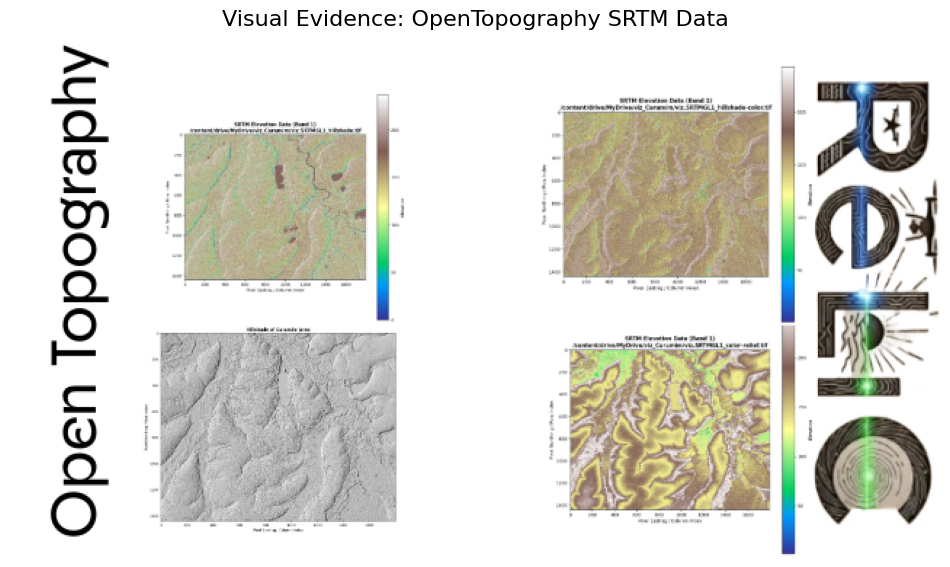


User uploaded file 'Open Topography-2.png'


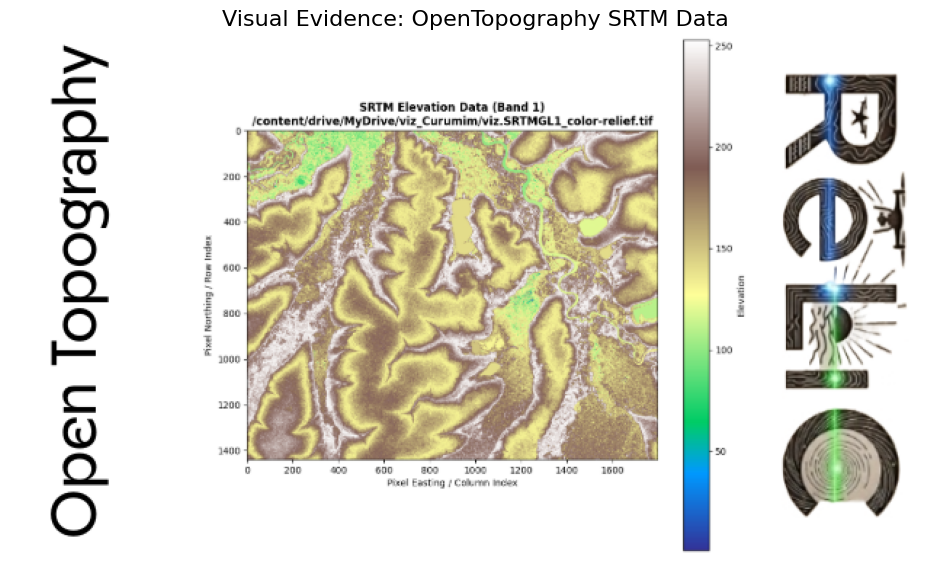


User uploaded file 'Open Topography-3.png'


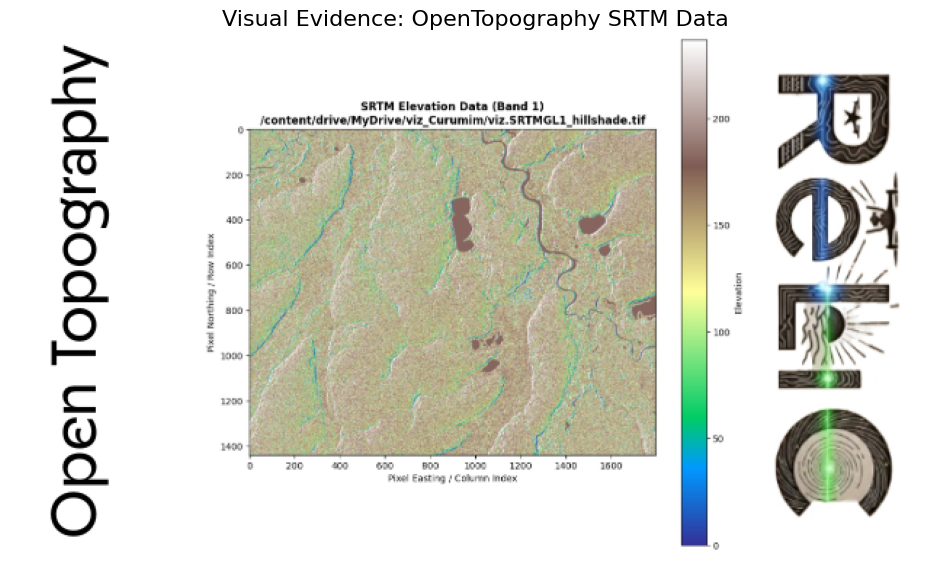


User uploaded file 'Open Topography-4.png'


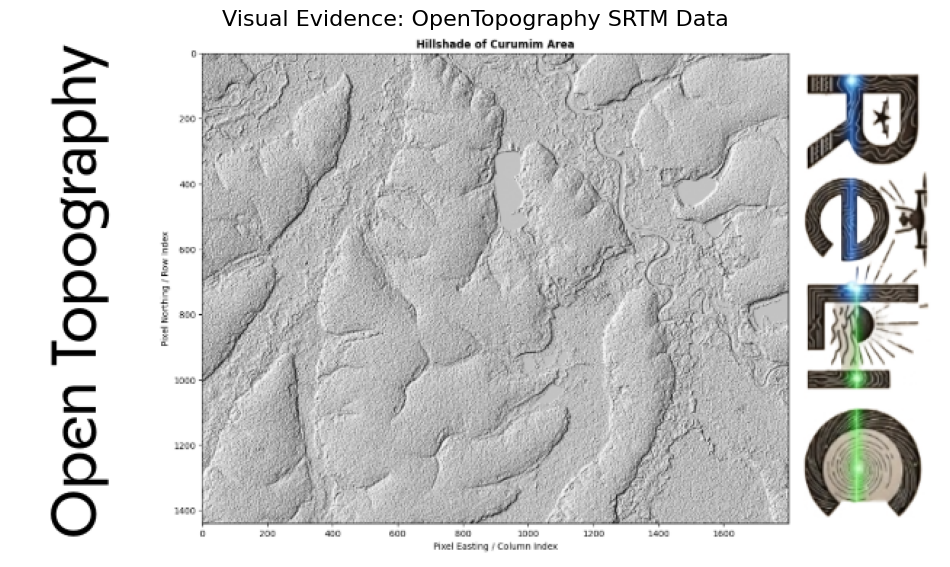


User uploaded file 'Open Topography-5.png'


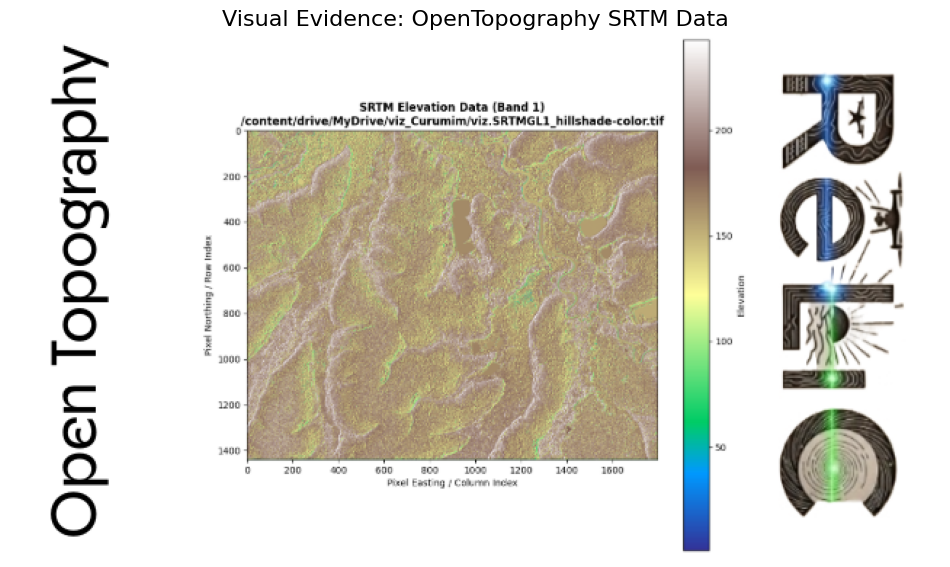

In [28]:
#Open Topography
# --- FINAL, NO-FAIL IMAGE UPLOAD AND DISPLAY ---

from google.colab import files
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("Please upload your image file. A 'Choose Files' button will appear.")

try:
  # This creates an upload button
  uploaded = files.upload()

  # Get the name of the file you just uploaded
  for filename in uploaded.keys():
    print(f"\nUser uploaded file '{filename}'")

    # Read and display the uploaded image
    img = mpimg.imread(filename)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off') # Hide the axis for a clean look
    plt.title("Visual Evidence: OpenTopography SRTM Data", fontsize=16)
    plt.show()

except Exception as e:
  print(f"An error occurred: {e}")

Please upload your image file. A 'Choose Files' button will appear.


Saving Original OT-1.jpg to Original OT-1.jpg
Saving Original OT-2.jpg to Original OT-2.jpg

User uploaded file 'Original OT-1.jpg'


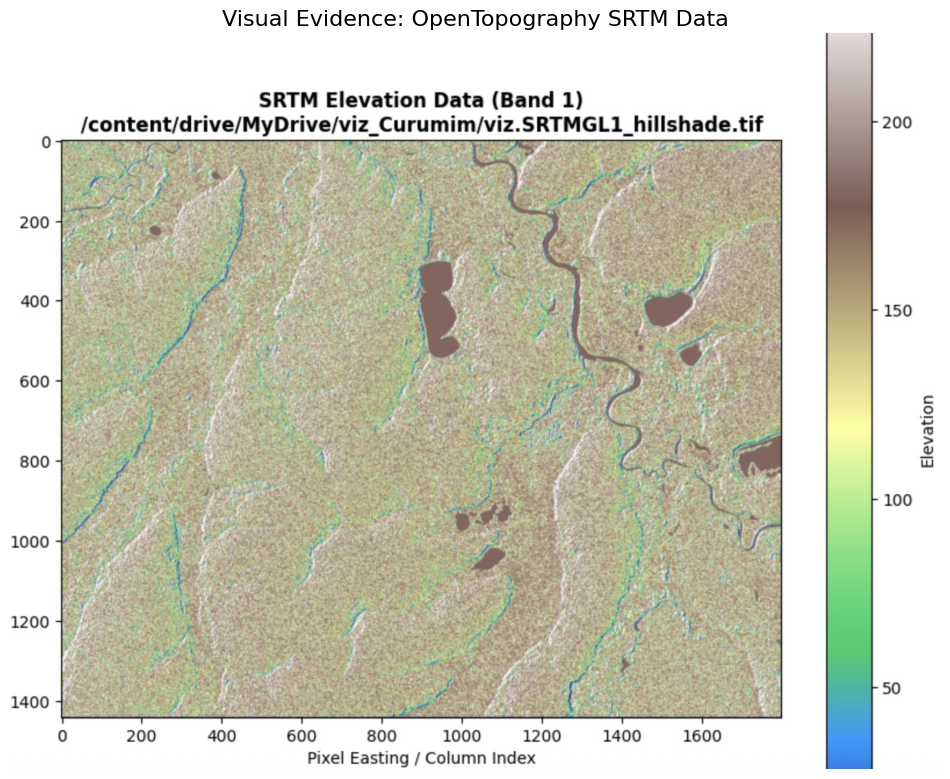


User uploaded file 'Original OT-2.jpg'


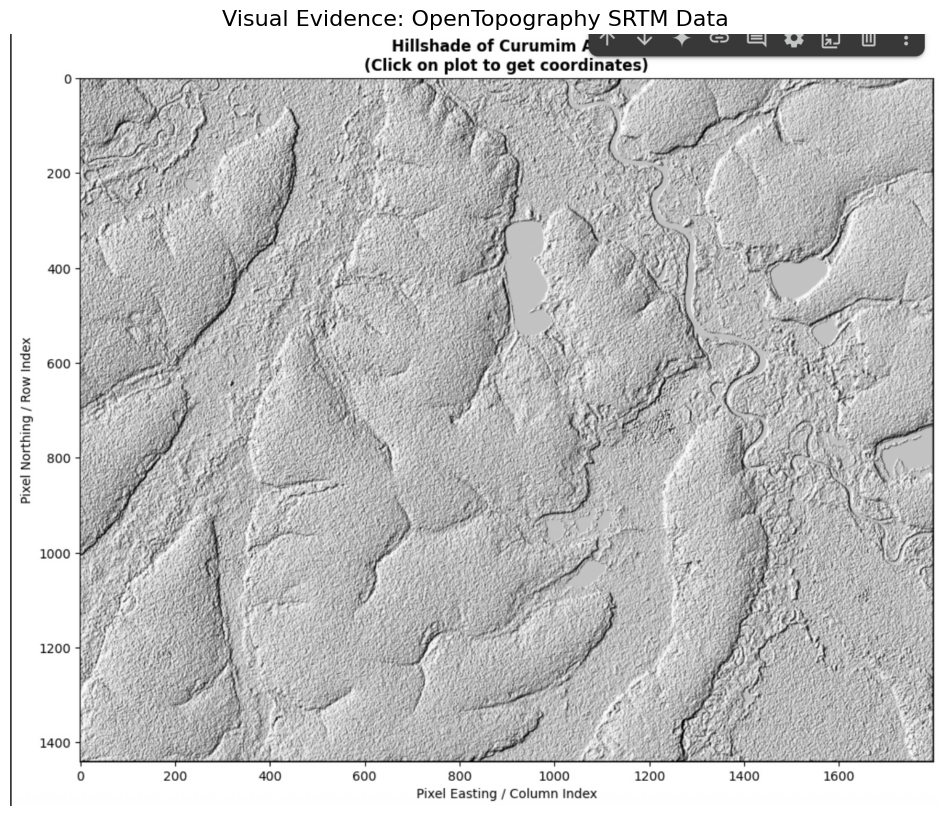

In [31]:
# Original Open Topography Images
# --- FINAL, NO-FAIL IMAGE UPLOAD AND DISPLAY ---

from google.colab import files
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("Please upload your image file. A 'Choose Files' button will appear.")

try:
  # This creates an upload button
  uploaded = files.upload()

  # Get the name of the file you just uploaded
  for filename in uploaded.keys():
    print(f"\nUser uploaded file '{filename}'")

    # Read and display the uploaded image
    img = mpimg.imread(filename)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off') # Hide the axis for a clean look
    plt.title("Visual Evidence: OpenTopography SRTM Data", fontsize=16)
    plt.show()

except Exception as e:
  print(f"An error occurred: {e}")


Please upload your image file. A 'Choose Files' button will appear.


Saving Sentinel-2_1.png to Sentinel-2_1.png
Saving Sentinel-2_2.png to Sentinel-2_2.png
Saving Sentinel-2.png to Sentinel-2.png

User uploaded file 'Sentinel-2_1.png'


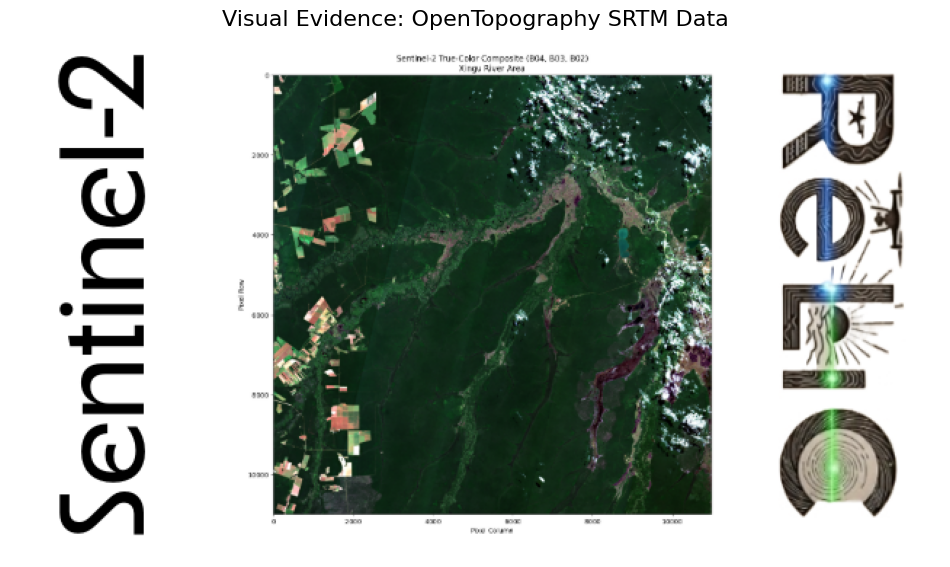


User uploaded file 'Sentinel-2_2.png'


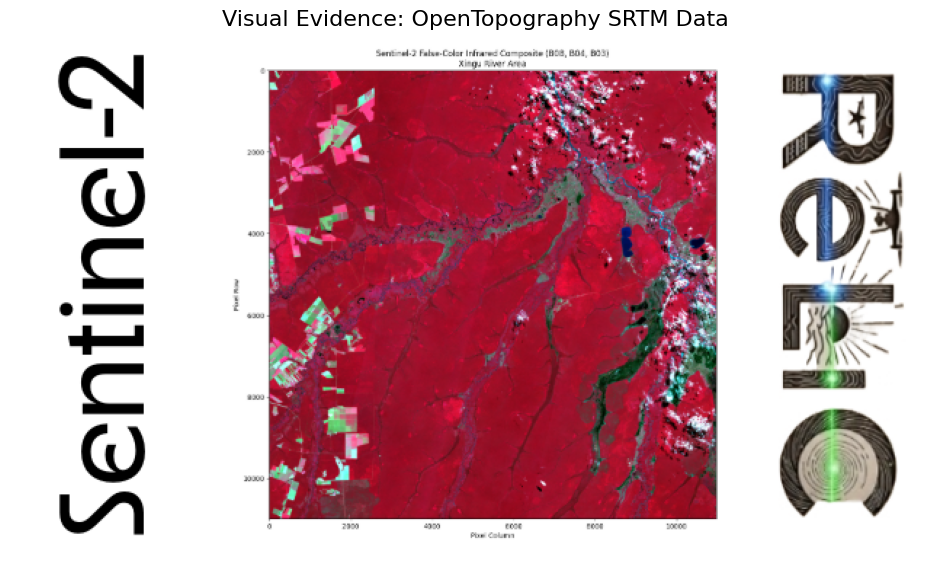


User uploaded file 'Sentinel-2.png'


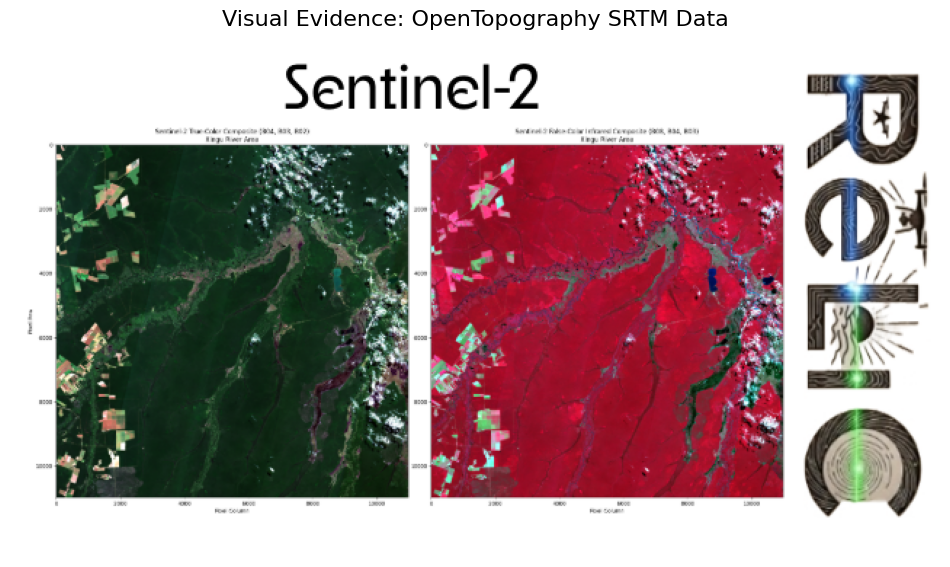

In [29]:
#Sentinel-2 (S2)
# --- FINAL, NO-FAIL IMAGE UPLOAD AND DISPLAY ---

from google.colab import files
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("Please upload your image file. A 'Choose Files' button will appear.")

try:
  # This creates an upload button
  uploaded = files.upload()

  # Get the name of the file you just uploaded
  for filename in uploaded.keys():
    print(f"\nUser uploaded file '{filename}'")

    # Read and display the uploaded image
    img = mpimg.imread(filename)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off') # Hide the axis for a clean look
    plt.title("Visual Evidence: OpenTopography SRTM Data", fontsize=16)
    plt.show()

except Exception as e:
  print(f"An error occurred: {e}")

Please upload your image file. A 'Choose Files' button will appear.


Saving Original S2-1.jpg to Original S2-1.jpg
Saving Original S2-2.jpg to Original S2-2.jpg

User uploaded file 'Original S2-1.jpg'


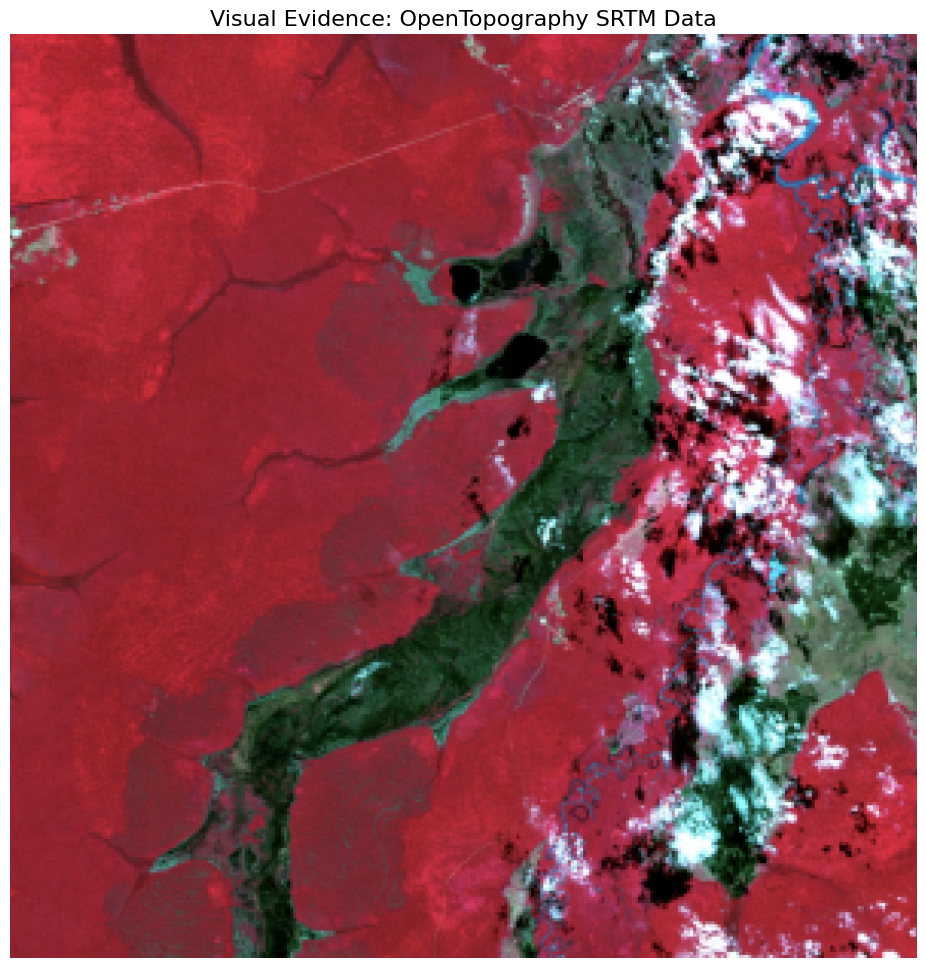


User uploaded file 'Original S2-2.jpg'


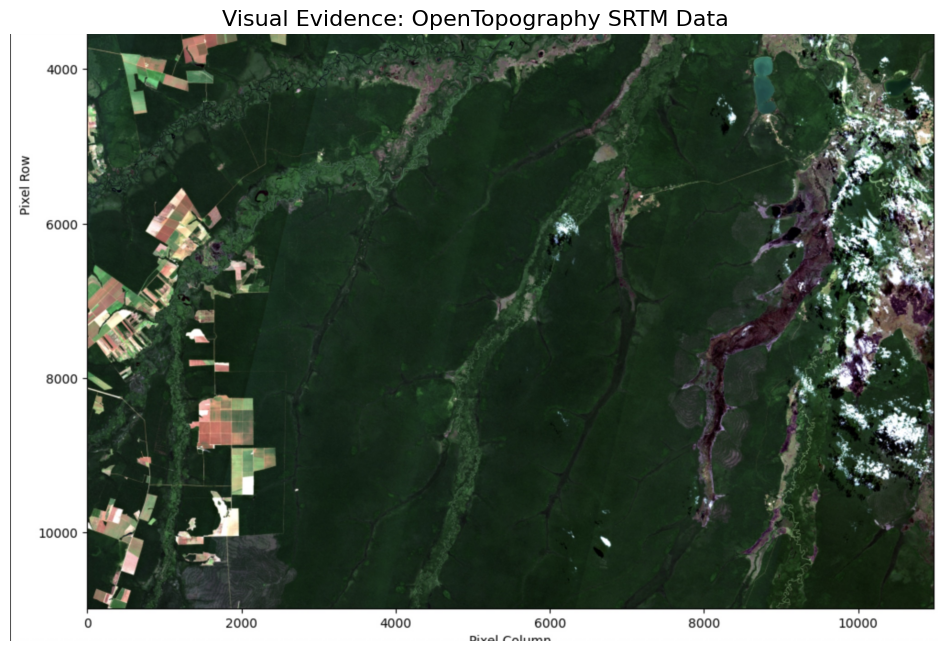

In [30]:
# Original Open Topography Images
# --- FINAL, NO-FAIL IMAGE UPLOAD AND DISPLAY ---

from google.colab import files
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("Please upload your image file. A 'Choose Files' button will appear.")

try:
  # This creates an upload button
  uploaded = files.upload()

  # Get the name of the file you just uploaded
  for filename in uploaded.keys():
    print(f"\nUser uploaded file '{filename}'")

    # Read and display the uploaded image
    img = mpimg.imread(filename)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off') # Hide the axis for a clean look
    plt.title("Visual Evidence: OpenTopography SRTM Data", fontsize=16)
    plt.show()

except Exception as e:
  print(f"An error occurred: {e}")
